**Making a Map**

In [10]:
import folium
import pandas as pd


In [11]:
offic_df = pd.read_csv('1877-official-register.csv')
print(offic_df.sample(5))
offic_df.dtypes

              Name State                  Department  \
155  Navajo Agency    NM  Department of the Interior   
867   Fort Randall    SD              War Department   
255  Crescent City    CA                    Judicial   
168   Union Agency    OK  Department of the Interior   
722    Brownsville    TX         Treasury Department   

                         Type  People   Latitude   Longitude  
155  Office of Indian Affairs       8  35.683429 -108.145539  
867                   Outpost     137  43.018889  -98.624167  
255              Commissioner       1  41.755750 -124.202591  
168  Office of Indian Affairs       1  35.747870  -95.369690  
722             Special Agent       1  25.901747  -97.497484  


Name           object
State          object
Department     object
Type           object
People          int64
Latitude      float64
Longitude     float64
dtype: object

In [6]:
offic_map_empty = folium.Map(location=[40, -112], zoom_start=4)
offic_map_empty

In [7]:
def create_empty_map():
    return folium.Map(location=[40, -112], zoom_start=4)

offic_map = create_empty_map()
offic_map


In [8]:
missing_values = offic_df.isna().sum()
print(missing_values)

Name          0
State         0
Department    0
Type          0
People        0
Latitude      0
Longitude     0
dtype: int64


In [9]:
offic_df_locations = offic_df[offic_df['Latitude'].notna()]
print(len(offic_df))
print(len(offic_df_locations))

903
903


In [10]:
folium.Marker(location=[35.40, -112.469], popup="Prescott Federal Employee Register").add_to(offic_map)
offic_map

In [11]:
def create_map_markers(row, map_name):
    folium.Marker(location=[row['Latitude'], row['Longitude']], popup=row['Name']).add_to(map_name)


In [12]:
#create a base empty map
offic_map = create_empty_map()

#generate a random row of data
sample_row = offic_df_locations.sample(1)

#use our function on the random row
create_map_markers(sample_row, offic_map)

#display the map
offic_map

C:\Users\rlove\anaconda3\Lib\site-packages\folium\utilities.py:101: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  float(coord)
C:\Users\rlove\anaconda3\Lib\site-packages\folium\utilities.py:107: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  if math.isnan(float(coord)):
C:\Users\rlove\anaconda3\Lib\site-packages\folium\utilities.py:109: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return [float(x) for x in coords]


In [13]:
# Method 2: Using .apply() to add markers with our function for all rows
# initialize an empty map
offic_map = offic_map_empty

# Now apply this function to each row in our filtered DataFrame
# For each row, we'll pass:
# 1. The row itself (handled automatically by .apply())
# 2. Our map object (we need to specify this explicitly)
# 3. The "axis" value for .apply() to indicate we want to process row by row
# .apply() allows you to apply a function to each row in the dataframe
offic_df_locations.apply(
    create_map_markers, # The function to apply
    map_name=offic_map, # Additional argument to pass to the function
    axis='columns' # Process row by row instead of column by column
)

offic_map

**Making Tooltip Options**

In [15]:
def create_circle_markers(row, map_name):
    folium.CircleMarker(location=[row['Latitude'], row['Longitude']],
                       radius=10,
                       fill=True,
                       popup=folium.Popup(f"{row['Name'].title()}", max_width=200),
                       tooltip=f"{row['Name'].title()}"
                       ).add_to(map_name)

In [16]:
# initialize an empty map
offic_map = create_empty_map()

# call our function for each row
offic_df_locations.apply(create_circle_markers, map_name=offic_map, axis="columns")

offic_map

Name of Location

In [18]:
# alter map appearance
def create_circle_markers(row, map_name):
    folium.CircleMarker(location=[row['Latitude'], row['Longitude']],
                       radius=6,
                       color='blue',
                       fill=True,
                       fill_color='white',
                       fill_opacity=0.6,
                       popup=folium.Popup(f"Post Office: {row['Name'].title()}", max_width=200),
                       tooltip=f"Location Name: {row['Name']}"
                       ).add_to(map_name)

# initialize an empty map
offic_map = create_empty_map()

# call our function for each row
offic_df_locations.apply(
    create_circle_markers, # The function to apply
    map_name=offic_map, # Additional argument to pass to the function
    axis='columns' # Process row by row instead of column by column
)

offic_map

Government Agency 

In [20]:
def create_circle_markers(row, map_name):
    folium.CircleMarker(location=[row['Latitude'], row['Longitude']],
                       radius=6,
                       color='blue',
                       fill=True,
                       fill_color='white',
                       fill_opacity=0.6,
                       popup=folium.Popup(f"Post Office: {row['Name'].title()}", max_width=200),
                       tooltip=f"Department Name: {row['Department']}"
                       ).add_to(map_name)

# initialize an empty map
offic_map = create_empty_map()

# call our function for each row
offic_df_locations.apply(
    create_circle_markers, # The function to apply
    map_name=offic_map, # Additional argument to pass to the function
    axis='columns' # Process row by row instead of column by column
)

offic_map

Number of People Working

In [22]:
def create_circle_markers(row, map_name):
    folium.CircleMarker(location=[row['Latitude'], row['Longitude']],
                       radius=6,
                       color='blue',
                       fill=True,
                       fill_color='white',
                       fill_opacity=0.6,
                       popup=folium.Popup(f"Post Office: {row['Name'].title()}", max_width=200),
                       tooltip=f"Number of People: {row['People']}"
                       ).add_to(map_name)

# initialize an empty map
offic_map = create_empty_map()

# call our function for each row
offic_df_locations.apply(
    create_circle_markers, # The function to apply
    map_name=offic_map, # Additional argument to pass to the function
    axis='columns' # Process row by row instead of column by column
)

offic_map

**Size of Employed**

In [24]:
# make new function to create circle markers sized by postmaster salary
def create_sized_circle_markers(row, map_name):
    folium.CircleMarker(location=[row['Latitude'], row['Longitude']],
                       radius=row['People'],
                       fill=False,
                       popup=folium.Popup(f"Post Office: {row['Name'].title()}", max_width=200),
                       tooltip=f"Postmaster Salary: ${row['People']}"
                       ).add_to(map_name)

# initialize an empty map
offic_map = create_empty_map()

# call our function for each row
offic_df_locations.apply(
    create_sized_circle_markers, # The function to apply
    map_name=offic_map, # Additional argument to pass to the function
    axis='columns' # Process row by row instead of column by column
)

offic_map


In [25]:
# make new function to create circle markers sized by postmaster salary - this time adjusting the radius size in pixels to make it more legible
def create_sized_circle_markers(row, map_name):
    folium.CircleMarker(location=[row['Latitude'], row['Longitude']],
                       radius=row['People']/100,
                       fill=True,
                       popup=folium.Popup(f"Post Office: {row['Name'].title()}", max_width=200),
                       tooltip=f"Number of Employees: {row['People']}"
                       ).add_to(map_name)

# initialize an empty map
offic_map = create_empty_map()

# call our function for each row
offic_df_locations.apply(
    create_sized_circle_markers, # The function to apply
    map_name=offic_map, # Additional argument to pass to the function
    axis='columns' # Process row by row instead of column by column
)

offic_map


In [26]:
offic_df_locations.describe()

,People,Latitude,Longitude
count,903.000000,903.000000,903.000000
mean,19.176080,38.974548,-108.959857
std,66.293517,5.508786,10.516498
min,1.000000,25.898333,-124.736600
25%,1.000000,35.584746,-120.409982
50%,1.000000,39.150171,-107.779780
75%,4.000000,42.871109,-97.743061
max,881.000000,48.966377,-93.322350


In [27]:
def add_employee_buckets(num_employees):
    if num_employees < 5:
        return 'Low'
    elif num_employees >= 5 and num_employees < 20:
        return 'Medium'
    elif num_employees >= 20 and num_employees < 100:
        return 'High'
    else:
        return 'Very High'


In [28]:
offic_df_locations['Employee_Bucket'] = offic_df_locations['People'].apply(add_employee_buckets)
offic_df_locations.head()

,Name,State,Department,Type,People,Latitude,Longitude,Employee_Bucket
0,Prescott,AZ,Department of the Interior,General Land Office Receivers,1,34.540024,-112.468503,Low
1,Florence,AZ,Department of the Interior,General Land Office Receivers,1,33.031451,-111.387343,Low
2,San Francisco,CA,Department of the Interior,General Land Office Receivers,1,37.774929,-122.419416,Low
3,Marysville,CA,Department of the Interior,General Land Office Receivers,1,39.145725,-121.591355,Low
4,Humboldt,CA,Department of the Interior,General Land Office Receivers,1,40.745005,-123.869509,Low


In [29]:
# create a function to add marker sizes based on the salary bucket
def add_marker_sizes(category):
    if category == 'Low Number of Employees':
        return 4
    elif category == 'Medium Number of Employees':
        return 8
    elif category == 'High Number of Employees':
        return 12
    else:
        return 16
        
#test out the function
add_marker_sizes('High Number of Employees')


12

In [30]:
offic_df_locations['Marker_Size'] = offic_df_locations['Employee_Bucket'].apply(add_marker_sizes)
offic_df_locations.head(10)


,Name,State,Department,Type,People,Latitude,Longitude,Employee_Bucket,Marker_Size
0,Prescott,AZ,Department of the Interior,General Land Office Receivers,1,34.540024,-112.468503,Low,16
1,Florence,AZ,Department of the Interior,General Land Office Receivers,1,33.031451,-111.387343,Low,16
2,San Francisco,CA,Department of the Interior,General Land Office Receivers,1,37.774929,-122.419416,Low,16
3,Marysville,CA,Department of the Interior,General Land Office Receivers,1,39.145725,-121.591355,Low,16
4,Humboldt,CA,Department of the Interior,General Land Office Receivers,1,40.745005,-123.869509,Low,16
5,Stockton,CA,Department of the Interior,General Land Office Receivers,1,37.957702,-121.290780,Low,16
6,Visalia,CA,Department of the Interior,General Land Office Receivers,1,36.330228,-119.292059,Low,16
7,Sacramento,CA,Department of the Interior,General Land Office Receivers,1,38.581572,-121.494400,Low,16
8,Los Angeles,CA,Department of the Interior,General Land Office Receivers,1,34.052234,-118.243685,Low,16
9,Shasta,CA,Department of the Interior,General Land Office Receivers,1,40.598119,-122.490757,Low,16


In [31]:
# make new function to create circle markers sized by salary category
def create_sized_circle_markers(row, map_name):
    folium.CircleMarker(location=[row['Latitude'], row['Longitude']],
                       radius=row['Marker_Size']/2,
                       fill=False,
                       opacity=0.6,
                       popup=folium.Popup(f"Location Name: {row['Name'].title()}", max_width=200),
                       tooltip=f"Number of Employees: {row['People']}"
                       ).add_to(map_name)

# initialize an empty map
offic_map = create_empty_map()

# call our function for each row
offic_df_locations.apply(
    create_sized_circle_markers, # The function to apply
    map_name=offic_map, # Additional argument to pass to the function
    axis='columns' # Process row by row instead of column by column
)

offic_map


**Top 10 Employee Locations** 

In [33]:
top_loc= offic_df.sort_values(by='People', ascending=False).head(10)
print(top_loc)

                      Name State      Department      Type  People   Latitude  \
875             Fort Clark    TX  War Department   Outpost     881  29.305833   
858              Fort Sill    OK  War Department   Outpost     548  34.704167   
884             Fort Brown    TX  War Department   Outpost     470  25.898333   
895        Fort DA Russell    WY  War Department   Outpost     465  41.166389   
823       Fort Leavenworth    KS  War Department   Outpost     441  39.355000   
894           Fort Laramie    WY  War Department   Outpost     431  42.209167   
822               Lewiston    ID  War Department     Other     427  46.399010   
830             Fort Ellis    MT  War Department   Outpost     394  45.654444   
845          Camp Robinson    NE  War Department   Outpost     391  42.668889   
834  Tongue River Barracks    MT  War Department  Barracks     388  46.409282   

      Longitude  
875 -100.408056  
858  -98.508333  
884  -97.492222  
895 -104.862778  
823  -94.921111  


In [34]:
import plotly.express as px

In [35]:
fig = px.bar(
    top_loc,
    x='Name',
    y='People',
    title='Top 10 Locations by Number of Employees',
    labels={'Location': 'Location', 'People': 'Number of Employees'},
    color='People',
    color_continuous_scale='Tealgrn' 
)
fig.update_layout(
    xaxis_tickangle=-45,
    template='plotly_white'
)

fig.show()

In [36]:
state_summary = offic_df.groupby('State')['People'].sum().reset_index()
state_summary = state_summary.sort_values(by='People', ascending=False).reset_index(drop=True)
top_10_states = state_summary.head(10)
print(top_10_states) 

  State  People
0    TX    3643
1    WY    1646
2    MT    1447
3    AZ    1303
4    NE    1296
5    CA    1212
6    OK    1107
7    KS     990
8    SD     930
9    NM     892


In [37]:
fig = px.bar(
    top_10_states,
    x='State',
    y='People',
    title='Top 10 States by Number of Government Employees',
    labels={'State': 'State', 'People': 'Number of Employees'},
    color='People',
    color_continuous_scale='Tealgrn'
)
fig.update_layout(
    template='plotly_white',
    xaxis_title='State',
    yaxis_title='Number of Employees',
    xaxis_tickangle=-45,
    font=dict(size=14)
)
fig.show()

**Largest Number of Government Departments**

In [39]:
department_summary = offic_df.groupby('Department')['People'].sum().reset_index()
department_summary = department_summary.sort_values(by='People', ascending=False).reset_index(drop=True)
print(department_summary.head(10))

                   Department  People
0              War Department   14940
1         Treasury Department    1080
2  Department of the Interior     891
3                    Judicial     405


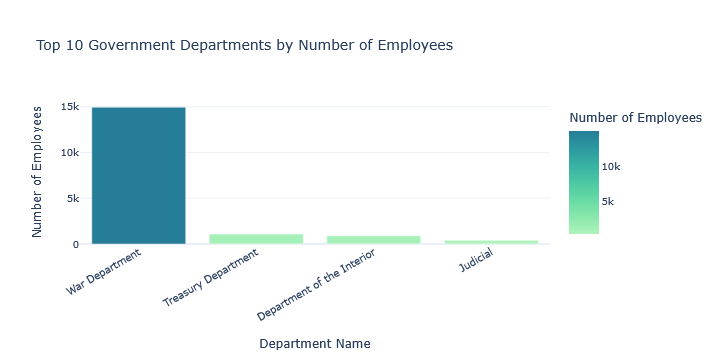

In [40]:
top_departments = department_summary.head(10)
fig = px.bar(
    top_departments,
    x='Department',
    y='People',
    title='Top 10 Government Departments by Number of Employees',
    labels={'Department': 'Department Name', 'People': 'Number of Employees'},
    color='People',
    color_continuous_scale='Tealgrn'
)
fig.update_layout(
    template='plotly_white',
    xaxis_tickangle=-30,
    font=dict(size=10)
)
fig.show()

In [41]:
state_location_count = offic_df.groupby('State')['Department'].nunique().reset_index()
state_location_count = state_location_count.sort_values(by='Department', ascending=False).reset_index(drop=True)

print(state_location_count)

   State  Department
0     AZ           4
1     NE           4
2     WA           4
3     UT           4
4     SD           4
5     OR           4
6     NV           4
7     NM           4
8     ND           4
9     MT           4
10    KS           4
11    ID           4
12    CO           4
13    CA           4
14    WY           4
15    TX           3
16    OK           2
17    BC           1


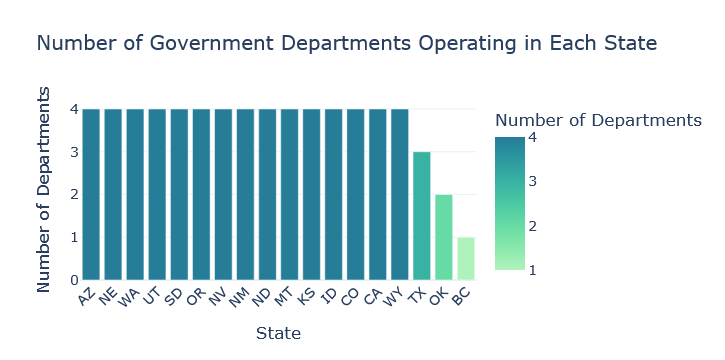

In [42]:
fig = px.bar(
    state_location_count,
    x='State',
    y='Department',
    title='Number of Government Departments Operating in Each State',
    labels={'State': 'State', 'Department': 'Number of Departments'},
    color='Department',
    color_continuous_scale='Tealgrn'
)
fig.update_layout(
    template='plotly_white',
    xaxis_tickangle=-45,
    font=dict(size=14)
)
fig.show()


In [16]:
ai_data= offic_df.sample(10)

In [18]:
print(ai_data)

                    Name State                  Department  \
729        San Francisco    CA         Treasury Department   
546          Placerville    CA         Treasury Department   
835             Missoula    MT              War Department   
796             Santa Fe    NM              War Department   
149  Spotted Tail Agency    NE  Department of the Interior   
3             Marysville    CA  Department of the Interior   
789        San Francisco    CA              War Department   
275            Hays City    KS                    Judicial   
495          Silver City    TX         Treasury Department   
394           Fort Clark    TX                    Judicial   

                                  Type  People   Latitude   Longitude  
729                          U.S. Mint     255  37.774929 -122.419416  
546  Internal Revenue_Deputy Collector       1  38.729625 -120.798546  
835                              Other      32  46.862121 -113.988298  
796                Department

In [22]:
ai_data.to_csv("AI_Data.csv",index=False)